<h1 align="center">Heart Attack - EDA</h1>

1. [Introduction](#1)
    - 1.1 [Data Dictionary](#2)
    - 1.2 [Task](#3)
    - 1.3 [Understanding Data](#21)
2. [Preparation](#4)
    - 2.1 [Packages](#5)
    - 2.2 [Data](#6)
    - 2.3 [Understanding Data](#7)
3. [Exploratory Data Analysis](#8)
    - 3.1 [Univariate Analysis](#9)
    - 3.2 [Bivariate Analysis](#10)
4. [Data Preprocessing](#11)
    - 4.1 [Conclusions from the EDA](#12)
    - 4.2 [Packages](#13)
    - 4.3 [Making features model ready](#14)
5. [Modeling](#15)
    - 5.1 [Linear Classifiers](#16)
    - 5.2 [Tree Models](#17)
    

### 1. Introduction <a id=1></a>

#### 1.1 Data Dictionary <a id=2></a>
`age` - Age of the patient

`sex` - Sex of the patient

`cp` - Chest pain type ~ 0 = Typical Angina, 1 = Atypical Angina, 2 = Non-anginal Pain, 3 = Asymptomatic

`trtbps` - Resting blood pressure (in mm Hg)

`chol` - Cholestoral in mg/dl fetched via BMI sensor

`fbs` - (fasting blood sugar > 120 mg/dl) ~ 1 = True, 0 = False

`restecg` - Resting electrocardiographic results ~ 0 = Normal, 1 = ST-T wave normality, 2 = Left ventricular hypertrophy

`thalachh`  - Maximum heart rate achieved

`oldpeak` - Previous peak

`slp` - Slope

`caa` - Number of major vessels 

`thall` - Thalium Stress Test result ~ (0,3)

`exng` - Exercise induced angina ~ 1 = Yes, 0 = No

`output` - Target variable

**Additional Variables Explaination from Kaggle**

**age** - age in years

**sex** - sex (1 = male; 0 = female)

**cp** - chest pain type (1 = typical angina; 2 = atypical angina; 3 = non-anginal pain; 0 = asymptomatic)

**trestbps** - resting blood pressure (in mm Hg on admission to the hospital)

**chol** - serum cholestoral in mg/dl

**fbs** - fasting blood sugar > 120 mg/dl (1 = true; 0 = false)

**restecg** - resting electrocardiographic results (1 = normal; 2 = having ST-T wave abnormality; 0 = hypertrophy)

**thalach** - maximum heart rate achieved

**exang** - exercise induced angina (1 = yes; 0 = no)

**oldpeak** - ST depression induced by exercise relative to rest

**slope** - the slope of the peak exercise ST segment (2 = upsloping; 1 = flat; 0 = downsloping)

**ca** - number of major vessels (0-3) colored by flourosopy

**thal** - 2 = normal; 1 = fixed defect; 3 = reversable defect

**num** - the predicted attribute - diagnosis of heart disease (angiographic disease status) (Value 0 = < diameter narrowing; Value 1 = > 50% diameter narrowing)

    Variable definition can be found in the discussion section

#### 1.2 Task <a id=3></a>
To perform EDA and predict if a person is prone to a heart attack or not.

#### 1.3 Understanding Data <a id=21></a>
* What is Heart Attack?





* How does it Happen?




* What are the most contributing Factors for heart attack to happen ?



* symptoms of heart attack for male and female?


### 2. Preparation <a id=4></a>

#### 2.1 Packages <a id=5></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msn
import os 
%matplotlib inline
sns.set() 
import requests


#### 2.2 Data <a id=6></a>

##### creat function to dowlnolad via url and check the dir 


In [2]:
def get_link(url):
    file_name = url.split('/')[-1]
    response = requests.get(url,allow_redirects=True) 
    if not os.path.isfile(file_name):
        with open(file_name, mode = 'wb') as file:
            file.write(response.content)
            


In [3]:
#dowenload datasetsusing created function (get_link)
cleveland = get_link('https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.cleveland.data')
hungarian = get_link('https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.hungarian.data')
switzerland = get_link('https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.switzerland.data')
va = get_link('https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.va.data')

In [4]:
os.getcwd()

'C:\\Users\\user\\Practice'

In [5]:
#read date in csv
df_clv = pd.read_csv("processed.cleveland.data" ,header = None)
df_hun = pd.read_csv("processed.hungarian.data" ,header = None)
df_sw = pd.read_csv("processed.switzerland.data" ,header = None)
df_va = pd.read_csv("processed.va.data" ,header = None)


#### creating function to append columns 


In [6]:
def append_columns(df):
    columns = [['age','sex','cp','trestbps','chol','fbs','restecg' ,'thalach',
                'eaxng' ,'oldpeak','slope','ca','thal','output']]
    for col in columns:
        df.columns=col

In [7]:
#let's append columns 
data_frames= [df_clv ,df_hun ,df_sw,df_va]
for df in data_frames:
    append_columns(df) 
    
    

#### create fuction to add location

In [8]:
def add_location(df , place):
        df['place'] = place


In [9]:
add_location(df_clv ,'clev')
add_location(df_hun , 'hun')
add_location(df_sw , 'sw')
add_location(df_va , 'va')

### Concating all dataframes together 

In [10]:
df = pd.concat([df_clv, df_hun ,df_sw ,df_va], ignore_index=True)
pd.set_option('display.max_rows', None)


#### 2.3 Understanding Data 

##### 2.3.1 The shape of the data

In [11]:
df.shape

(920, 15)

##### 2.3.2 Preview random 5 rows of the data

In [12]:
df.sample(5)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,eaxng,oldpeak,slope,ca,thal,output,place
805,63.0,1.0,4.0,130,308,0,0,138,1,2,2,?,?,2,va
264,61.0,1.0,4.0,138.0,166.0,0.0,2.0,125.0,1.0,3.6,2.0,1.0,3.0,4,clev
614,45.0,1.0,3.0,110,0,?,0,138,0,-.1,1,?,?,0,sw
768,59.0,1.0,3.0,?,0,0,0,128,1,2,3,?,?,2,va
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1,clev



##### 2.3.3 Checking the number of unique values in each column

In [13]:
for i in df.columns:
    print(f"The unique value in the {i} column = ", df[i].unique())
    print("----------------------------------------------------------------------------")

    


The unique value in the age column =  [63. 67. 37. 41. 56. 62. 57. 53. 44. 52. 48. 54. 49. 64. 58. 60. 50. 66.
 43. 40. 69. 59. 42. 55. 61. 65. 71. 51. 46. 45. 39. 68. 47. 34. 35. 29.
 70. 77. 38. 74. 76. 28. 30. 31. 32. 33. 36. 72. 73. 75.]
----------------------------------------------------------------------------
The unique value in the sex column =  [1. 0.]
----------------------------------------------------------------------------
The unique value in the cp column =  [1. 4. 3. 2.]
----------------------------------------------------------------------------
The unique value in the trestbps column =  [145.0 160.0 120.0 130.0 140.0 172.0 150.0 110.0 132.0 117.0 135.0 112.0
 105.0 124.0 125.0 142.0 128.0 170.0 155.0 104.0 180.0 138.0 108.0 134.0
 122.0 115.0 118.0 100.0 200.0 94.0 165.0 102.0 152.0 101.0 126.0 174.0
 148.0 178.0 158.0 192.0 129.0 144.0 123.0 136.0 146.0 106.0 156.0 154.0
 114.0 164.0 '130' '120' '140' '170' '100' '105' '110' '125' '150' '98'
 '112' '145' '190' '160'

##### 2.3.4 Separating the columns in categorical and continuous

##### 2.3.5 Summary statistics

In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,920.0,53.510870,9.424685,28.0,47.0,54.0,60.0,77.0
sex,920.0,0.789130,0.408148,0.0,1.0,1.0,1.0,1.0
cp,920.0,3.250000,0.930969,1.0,3.0,4.0,4.0,4.0
output,920.0,0.995652,1.142693,0.0,0.0,1.0,2.0,4.0


In [15]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,920.0,NaN,NaN,NaN,53.51087,9.424685,28.0,47.0,54.0,60.0,77.0
sex,920.0,NaN,NaN,NaN,0.78913,0.408148,0.0,1.0,1.0,1.0,1.0
cp,920.0,NaN,NaN,NaN,3.25,0.930969,1.0,3.0,4.0,4.0,4.0
trestbps,920,103,120,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN
chol,920.0,336.0,0.0,123.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
fbs,920,5,0,434,NaN,NaN,NaN,NaN,NaN,NaN,NaN
restecg,920,7,0,320,NaN,NaN,NaN,NaN,NaN,NaN,NaN
thalach,920,198,?,55,NaN,NaN,NaN,NaN,NaN,NaN,NaN
eaxng,920,5,0,324,NaN,NaN,NaN,NaN,NaN,NaN,NaN
oldpeak,920.0,82.0,0.0,288.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


##### 2.3.6 Missing values

In [16]:
df.isnull().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
eaxng       0
oldpeak     0
slope       0
ca          0
thal        0
output      0
place       0
dtype: int64

##### 2.3.6 dupicated  values

In [17]:
df.duplicated().sum()

2

### Handlling errors and  missing values 

In [18]:
for i in df.columns:
    print(f"Unique values in the {i} column = ", df[i].unique())
    print("----------------------------------------------------------------------------")


Unique values in the age column =  [63. 67. 37. 41. 56. 62. 57. 53. 44. 52. 48. 54. 49. 64. 58. 60. 50. 66.
 43. 40. 69. 59. 42. 55. 61. 65. 71. 51. 46. 45. 39. 68. 47. 34. 35. 29.
 70. 77. 38. 74. 76. 28. 30. 31. 32. 33. 36. 72. 73. 75.]
----------------------------------------------------------------------------
Unique values in the sex column =  [1. 0.]
----------------------------------------------------------------------------
Unique values in the cp column =  [1. 4. 3. 2.]
----------------------------------------------------------------------------
Unique values in the trestbps column =  [145.0 160.0 120.0 130.0 140.0 172.0 150.0 110.0 132.0 117.0 135.0 112.0
 105.0 124.0 125.0 142.0 128.0 170.0 155.0 104.0 180.0 138.0 108.0 134.0
 122.0 115.0 118.0 100.0 200.0 94.0 165.0 102.0 152.0 101.0 126.0 174.0
 148.0 178.0 158.0 192.0 129.0 144.0 123.0 136.0 146.0 106.0 156.0 154.0
 114.0 164.0 '130' '120' '140' '170' '100' '105' '110' '125' '150' '98'
 '112' '145' '190' '160' '115' '142'

In [19]:
#replacing errors (?) with nan value 
df = df.replace('?', np.NaN)


In [20]:
df.shape

(920, 15)

In [21]:
#check null values again
df.isnull().sum()

age           0
sex           0
cp            0
trestbps     59
chol         30
fbs          90
restecg       2
thalach      55
eaxng        55
oldpeak      62
slope       309
ca          611
thal        486
output        0
place         0
dtype: int64

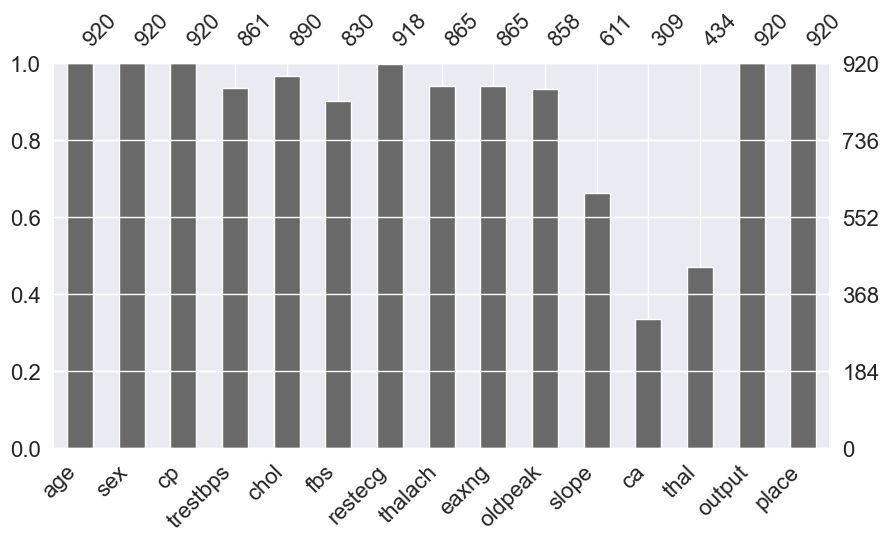

In [22]:
#visualizing missing values 
msn.bar(df , figsize=(10,5) ,color='dimgray');

### Now we have missing values , we have to determine  what type of misising values are !?
### in order to take the right action


In [23]:
#droping place column
df.drop('place',inplace=True ,axis=1)

### let's spillting catgorical and cont features 

In [24]:
df_cat = df[['sex','cp','fbs','restecg','eaxng' , 'slope' , 'ca' ,'thal' , 'output']]
df_cat.sample(1)

,sex,cp,fbs,restecg,eaxng,slope,ca,thal,output
249,1.0,2.0,1.0,2.0,0.0,1.0,0.0,3.0,0


In [25]:
df_cont =df[['age','trestbps','chol','thalach','oldpeak']]
df_cont.sample()


,age,trestbps,chol,thalach,oldpeak
168,35.0,126.0,282.0,156.0,0.0


In [26]:
for i in df_cat.columns:
    print(f"Unique values in the {i} column = ", df_cat[i].unique())
    print("----------------------------------------------------------------------------")


Unique values in the sex column =  [1. 0.]
----------------------------------------------------------------------------
Unique values in the cp column =  [1. 4. 3. 2.]
----------------------------------------------------------------------------
Unique values in the fbs column =  [1.0 0.0 '0' nan '1']
----------------------------------------------------------------------------
Unique values in the restecg column =  [2.0 0.0 1.0 '2' '0' '1' nan]
----------------------------------------------------------------------------
Unique values in the eaxng column =  [0.0 1.0 '0' '1' nan]
----------------------------------------------------------------------------
Unique values in the slope column =  [3.0 2.0 1.0 nan '2' '1' '3']
----------------------------------------------------------------------------
Unique values in the ca column =  ['0.0' '3.0' '2.0' '1.0' nan '0' '1' '2']
----------------------------------------------------------------------------
Unique values in the thal column =  ['6.0'

In [27]:
print(df_cat.dtypes)

sex        float64
cp         float64
fbs         object
restecg     object
eaxng       object
slope       object
ca          object
thal        object
output       int64
dtype: object


In [28]:
#coabsnverting data type in order to unify the numer format 
df_cat = df_cat.astype(float)
df_cat.sample(3)

,sex,cp,fbs,restecg,eaxng,slope,ca,thal,output
491,1.0,4.0,0.0,0.0,1.0,2.0,NaN,NaN,1.0
289,1.0,2.0,0.0,0.0,0.0,3.0,0.0,3.0,0.0
0,1.0,1.0,1.0,2.0,0.0,3.0,0.0,6.0,0.0


In [29]:
for i in df_cat.columns:
    print(f"Unique values in the {i} column = ", df_cat[i].unique())
    print("----------------------------------------------------------------------------")


Unique values in the sex column =  [1. 0.]
----------------------------------------------------------------------------
Unique values in the cp column =  [1. 4. 3. 2.]
----------------------------------------------------------------------------
Unique values in the fbs column =  [ 1.  0. nan]
----------------------------------------------------------------------------
Unique values in the restecg column =  [ 2.  0.  1. nan]
----------------------------------------------------------------------------
Unique values in the eaxng column =  [ 0.  1. nan]
----------------------------------------------------------------------------
Unique values in the slope column =  [ 3.  2.  1. nan]
----------------------------------------------------------------------------
Unique values in the ca column =  [ 0.  3.  2.  1. nan]
----------------------------------------------------------------------------
Unique values in the thal column =  [ 6.  3.  7. nan]
------------------------------------------------

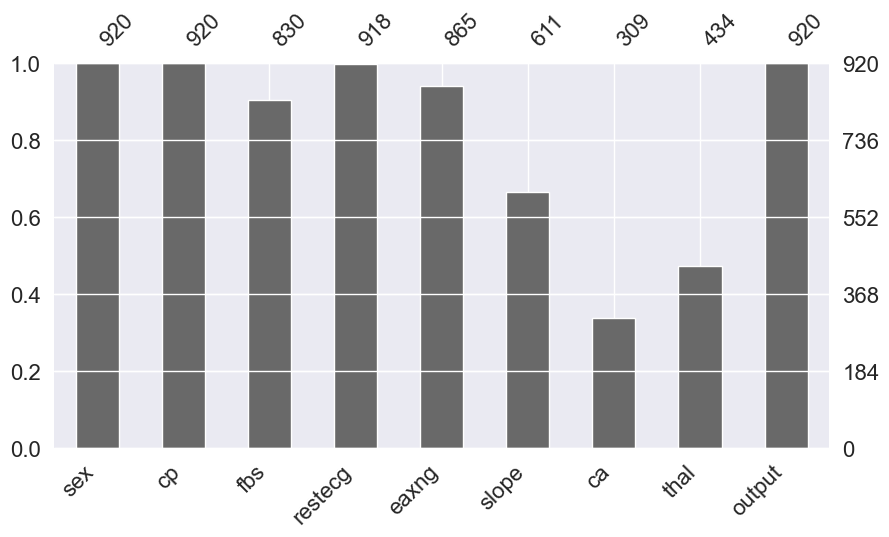

In [30]:
#visualizing missing values 
msn.bar(df_cat , figsize=(10,5) ,color='dimgray');

In [31]:
#df_cat.drop(['ca','slope','thal'],axis=1 , inplace=True)


In [32]:
x_cat = df_cat.values
x_cat

array([[ 1.,  1.,  1., ...,  0.,  6.,  0.],
       [ 1.,  4.,  0., ...,  3.,  3.,  2.],
       [ 1.,  4.,  0., ...,  2.,  7.,  1.],
       ...,
       [ 1.,  4.,  1., ..., nan,  6.,  2.],
       [ 1.,  4.,  1., ..., nan, nan,  0.],
       [ 1.,  2.,  0., ..., nan, nan,  1.]])

In [33]:
pip install sklearn

Note: you may need to restart the kernel to use updated packages.


In [34]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
it_imputer =  IterativeImputer(random_state=42)   
cat_imp = it_imputer.fit_transform(x_cat)  

In [35]:
df_cat = pd.DataFrame(data =cat_imp , columns = df_cat.columns)

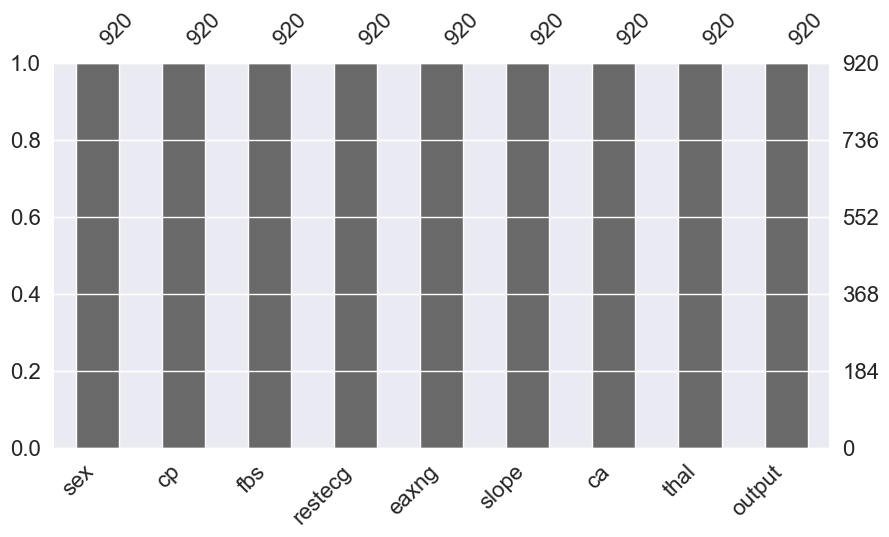

In [36]:
msn.bar(df_cat , figsize=(10,5) ,color='dimgray');

In [37]:
df_cat.shape

(920, 9)

### Hndling nan in numrical contnious featrures by imputing missing values using machine learning 

In [38]:
#CONVERTING CONT DF INTO NUMPY ARRAY TO IMPUTE IT  
x=df_cont.values
#from sklearn.preprocessing import StandardScaler
#sc = StandardScaler()
#scaled_X= sc.fit_transform(X)

In [39]:
#using ittrative imputer to predict miising values
# modeling each feature with missing values as a function of other features in a round-robin fashion
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
it_imputer =  IterativeImputer(random_state=42)   
x = it_imputer.fit_transform(x) 

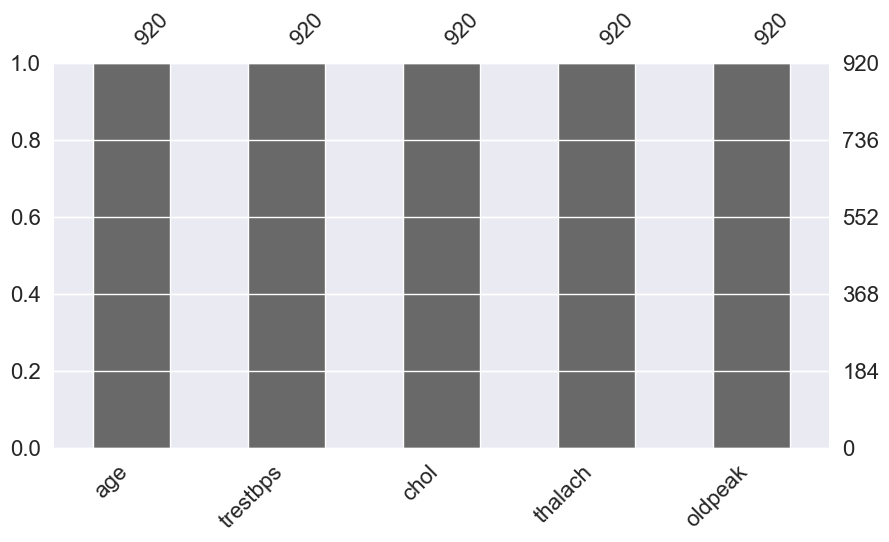

In [40]:
df_cont= pd.DataFrame(data =x , columns = df_cont.columns)
msn.bar(df_cont , figsize=(10,5) ,color='dimgray');

In [41]:
#checking x 
np.isnan(x).any()

False

In [42]:
x.shape

(920, 5)

In [43]:
#check missing value after imputing
df_cont.isnull().sum()

age         0
trestbps    0
chol        0
thalach     0
oldpeak     0
dtype: int64

In [44]:
#check ouput column
df['output'].value_counts()

0    411
1    265
2    109
3    107
4     28
Name: output, dtype: int64

### handlling error in target column 


In [45]:
# based on data dictionary output should be 2 classes only
df_cat['output'] = df_cat['output'].apply(lambda x:1 if x >=1 else 0)

In [46]:
df_cat['output'].value_counts()

1    509
0    411
Name: output, dtype: int64

In [47]:
#append datframe 

In [48]:
df = df_cont.join(df_cat)

In [49]:
df.isnull().sum()

age         0
trestbps    0
chol        0
thalach     0
oldpeak     0
sex         0
cp          0
fbs         0
restecg     0
eaxng       0
slope       0
ca          0
thal        0
output      0
dtype: int64

### 3. Exploratory Data Analysis <a id=8></a>

In [50]:
import pandas_profiling as pp
pp.ProfileReport(df)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### 3.1 Univariate Analysis <a id=9></a>

##### 3.1.1 Count plot of categorical features

pp.ProfileReport(data)


C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


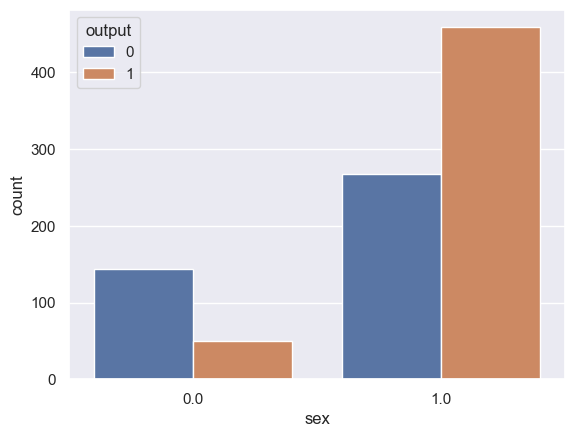

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


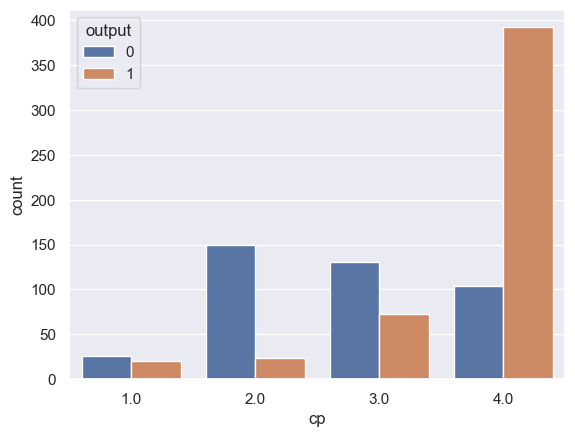

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


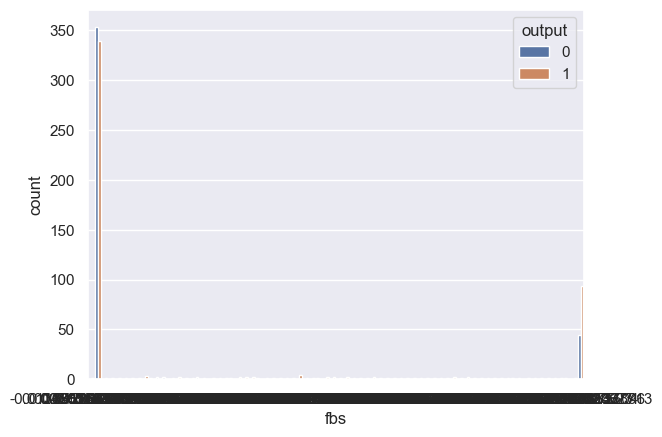

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


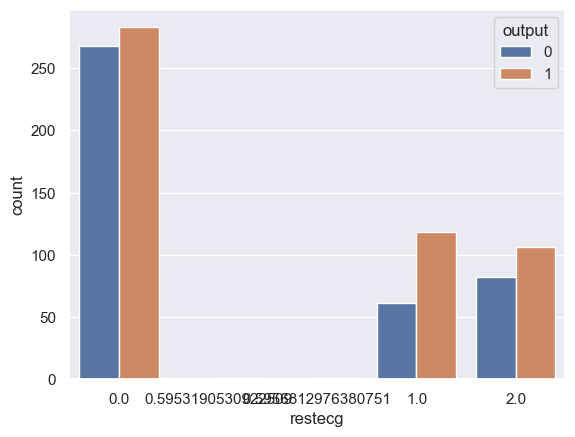

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


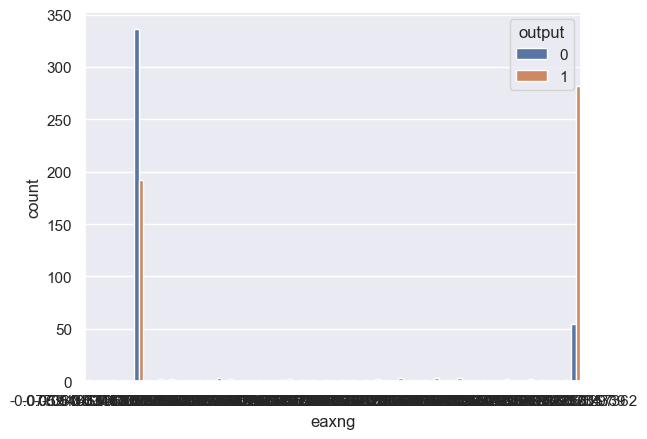

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


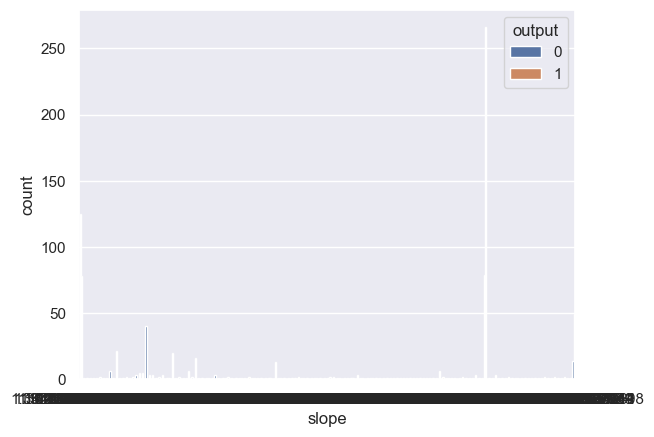

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


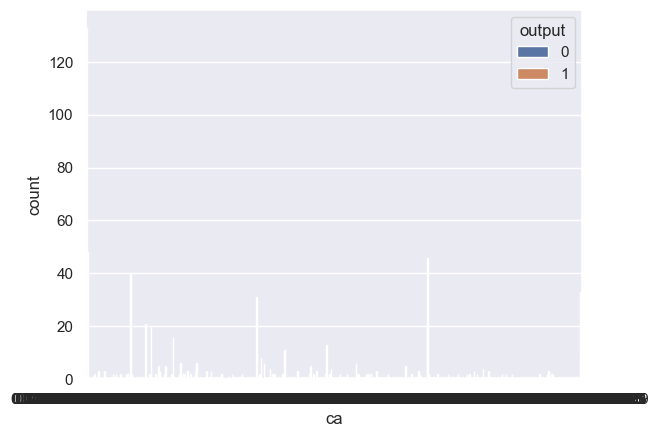

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


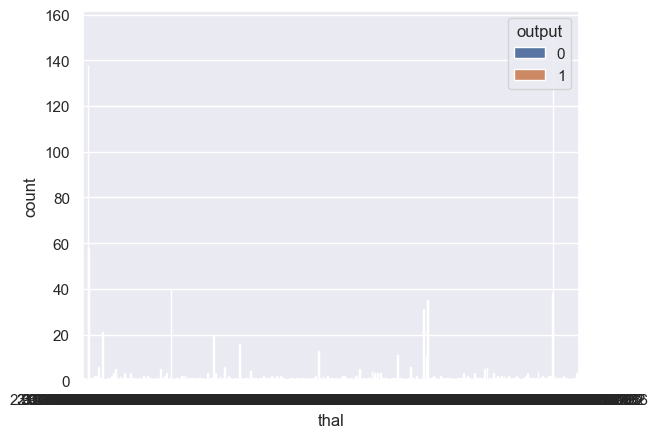

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


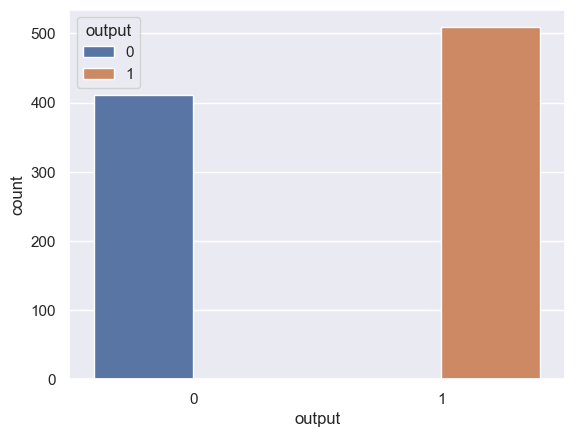

In [51]:
for i in df_cat:
    sns.countplot(df[i] , hue=df['output'])
    plt.show();

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


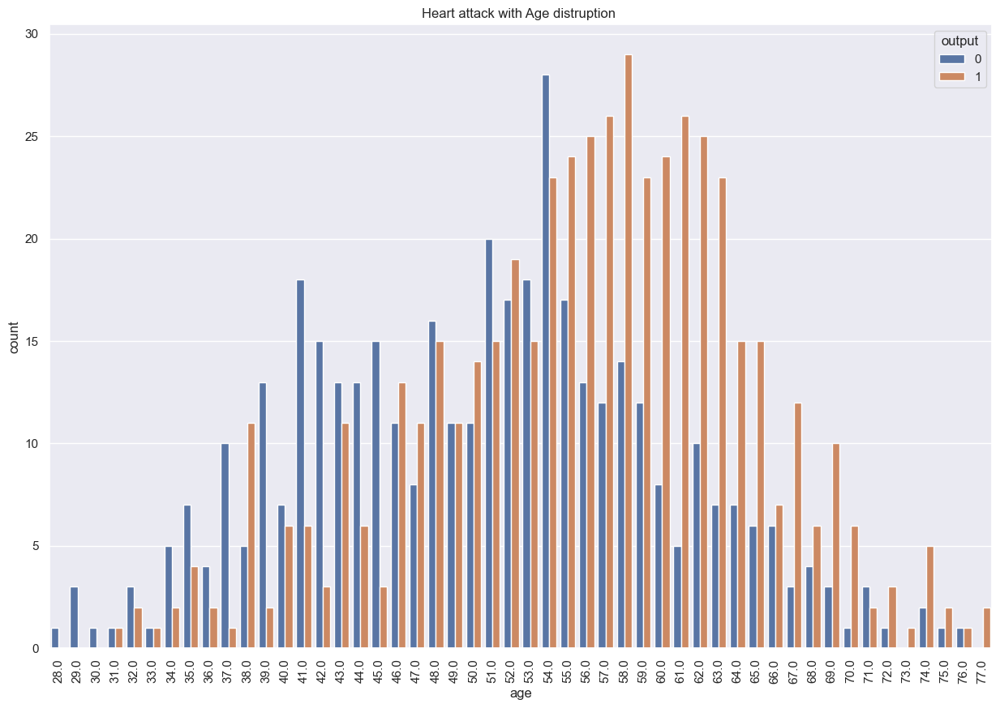

In [52]:
plt.figure(figsize=(15,10))
plt.xticks(ticks=range(30,70),rotation = 90)
sns.countplot(df['age'] ,hue=df['output'])
plt.title('Heart attack with Age distruption ');

##### 3.1.2 Boxen plot of continuous features

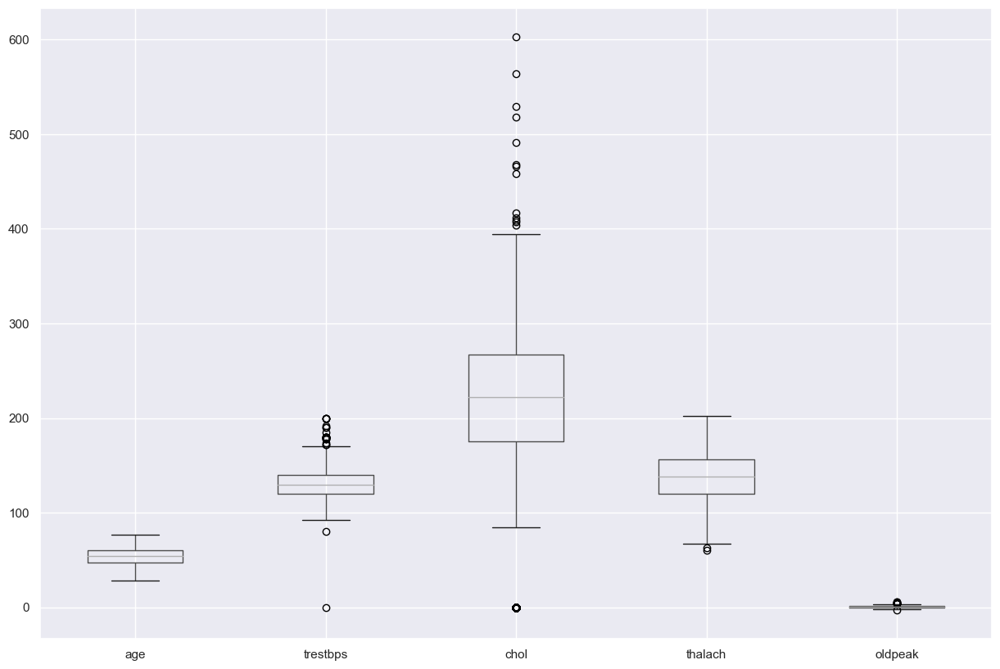

In [53]:
plt.figure(figsize=(15,10))
df_cont.boxplot()
plt.show()

C:\Users\user\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\user\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\user\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

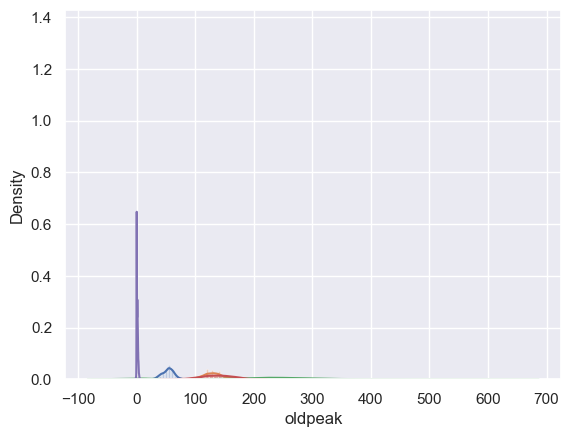

In [54]:
for i in df_cont:
    sns.distplot(df[i])


##### 3.1.2 Count plot of target

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='output', ylabel='count'>

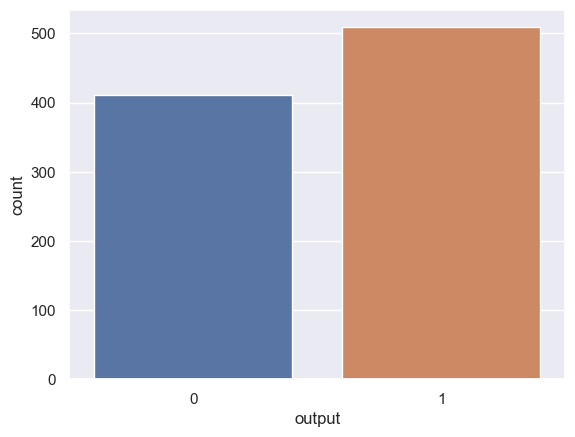

In [55]:
sns.countplot(df['output'])

#### 3.2 Bivariate Analysis <a id=10></a>

##### 3.2.1 Correlation matrix of continuous features

In [56]:
df_cont.corr()

,age,trestbps,chol,thalach,oldpeak
age,1.000000,0.252614,-0.089569,-0.375591,0.266522
trestbps,0.252614,1.000000,0.100119,-0.108305,0.166002
chol,-0.089569,0.100119,1.000000,0.245962,0.047122
thalach,-0.375591,-0.108305,0.245962,1.000000,-0.154072
oldpeak,0.266522,0.166002,0.047122,-0.154072,1.000000


##### 3.2.2 Scatterplot heatmap of dataframe

<AxesSubplot:>

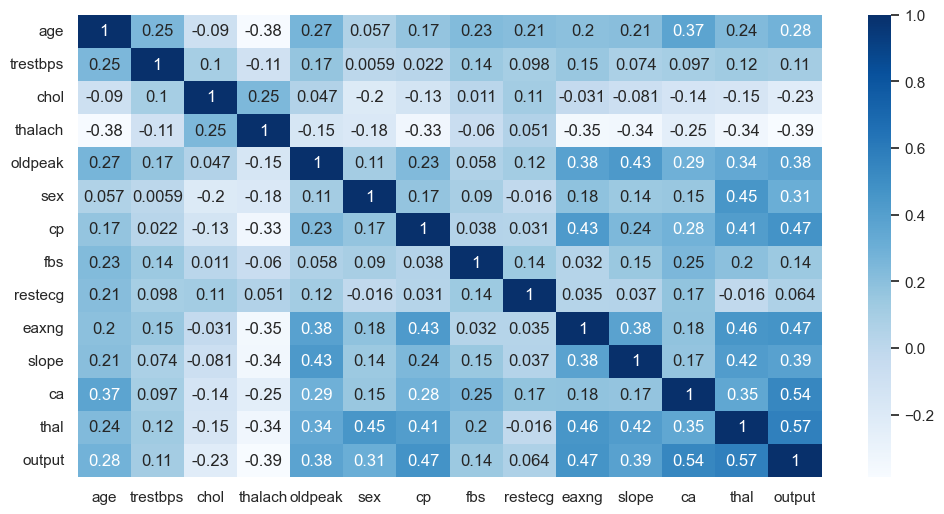

In [57]:
plt.figure(figsize=(12,6))
sns.heatmap(df.corr(),annot=True , cmap='Blues')

##### 3.2.3 Distribution of continuous features according to target variable

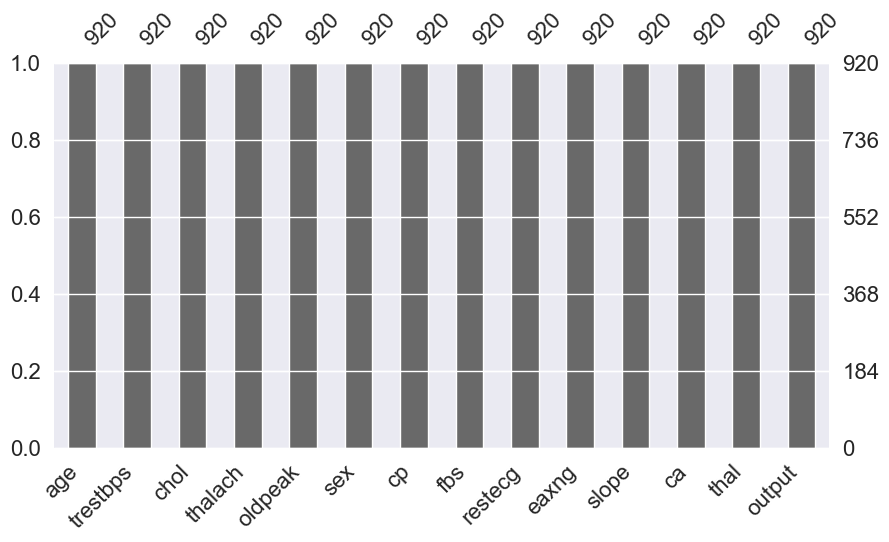

In [58]:
#visualizing missing values 
msn.bar(df , figsize=(10,5) ,color='dimgray');

##### 3.2.4 Some other relations that seemed intuitive

##### 3.2.5 Pairplot according to target variable - one plot to rule them all

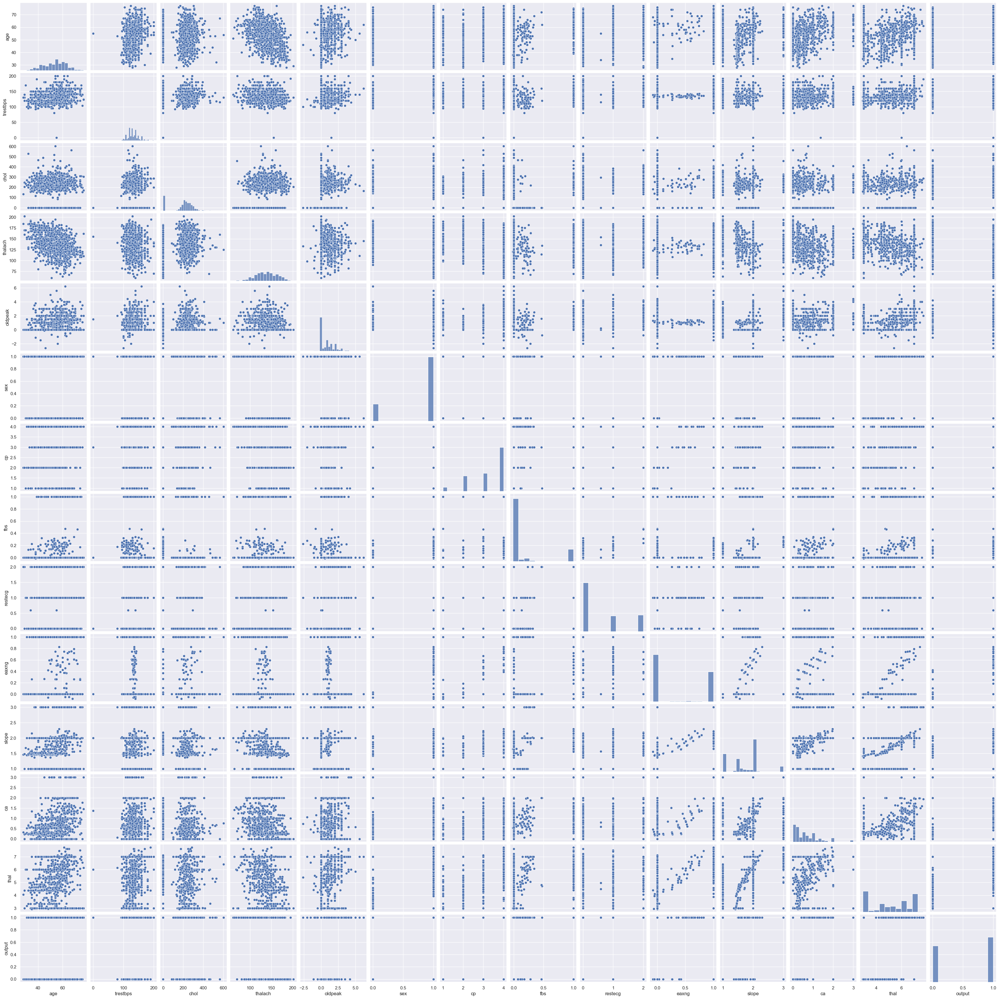

In [59]:
sns.pairplot(df, kind="scatter")
plt.show()

### 4. Data Preprocessing <a id=11></a>

#### 4.1 Conclusions from the EDA <a id=12></a>


#### 4.2 Packages <a id=13></a>


#### 4.3 Making features model ready <a id=14></a>

##### 4.3.1 Scaling and Encoding features

In [60]:
X = df.iloc[: , :-1].to_numpy()


In [61]:
y= df.iloc[: , -1].to_numpy()


In [62]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
scaled_X= sc.fit_transform(X)

##### 4.3.2 Train and test split

In [63]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_X,y,test_size=.2 , random_state=42)

In [64]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

#X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2

### 5. Modeling <a id=15></a>

#### 5.1 Linear Classifiers <a id=16></a>

##### 5.1.1 Support Vector Machines

In [66]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score , confusion_matrix, classification_report
score = []
kernel = ['linear' , 'rbf' , 'sigmoid','poly']
for k in kernel:
  model = SVC(kernel=k , degree=3, gamma='scale')
  model.fit(X_train,y_train)
  y_pred = model.predict(X_test)
  score.append(accuracy_score(y_pred , y_test))

##### 5.1.2 Hyperparameter tuning of SVC

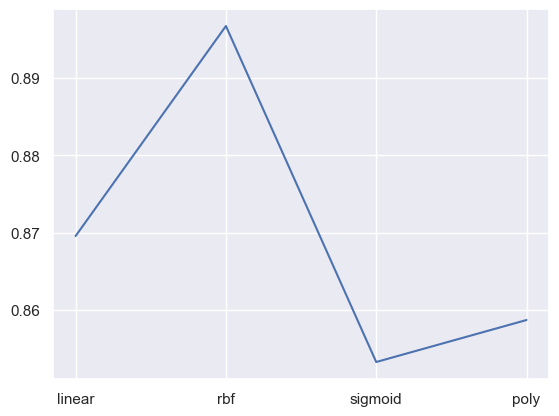

In [67]:
#using manual hyberparmeter tuning 
plt.plot(range(len(kernel)) , score )
plt.xticks(labels=kernel ,ticks=range(len(kernel)));


In [68]:
score = []
c= [1,10 ,100 ,1000]
for i in c:
  model = SVC(C=i , kernel='rbf', degree=3, gamma='auto')
  model.fit(X_train ,y_train)
  y_pred = model.predict(X_test)
  score.append(accuracy_score(y_pred , y_test))

In [69]:
model = SVC(kernel='rbf' , degree=1, gamma='auto', C=1)
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_pred , y_test)
print (F'Accurcay is {round(accuracy_score(y_pred,y_test),3)*100}%')
print (classification_report(y_pred,y_test))

Accurcay is 89.7%
              precision    recall  f1-score   support

           0       0.95      0.83      0.88        86
           1       0.86      0.96      0.91        98

    accuracy                           0.90       184
   macro avg       0.90      0.89      0.90       184
weighted avg       0.90      0.90      0.90       184



In [70]:
#using cross validion 

from sklearn.model_selection import KFold, cross_val_score ,StratifiedKFold
#model = SVC(kernel='rbf' , degree=1, gamma='auto', C=1)

k_folds = KFold(n_splits = 10)
model = SVC(kernel='rbf' , degree=1, gamma='auto', C=1)
scores = cross_val_score(model,X_train, y_train, cv = k_folds)
print (f' score using cross validation method is {round(scores.mean()*100 , 2)}%')

 score using cross validation method is 89.42%


In [71]:
#Using grid search 
from sklearn.model_selection import GridSearchCV
import time 

grid = { 
    'kernel': ['linear' , 'rbf' , 'sigmoid','poly'],
    'degree': [1,2,3,4,5],
    'C':[1,100,1000],
    'gamma':['scale', 'auto'],
    }
start = time.time()
svm_cv = GridSearchCV(estimator=SVC(), param_grid=grid, cv= 5)
svm_cv.fit(X_train, y_train)
end =time.time()

print(end - start)

259.7574610710144


In [72]:
svm_cv.best_params_

{'C': 100, 'degree': 1, 'gamma': 'auto', 'kernel': 'poly'}

In [73]:
svc_cv = SVC(kernel='poly' , degree=1, gamma='auto', C=100).fit(X_train, y_train)
y_pred =svc_cv.predict(X_test)
print (F'Accurcay using grid search is {round(accuracy_score(y_pred,y_test),3)*100}%')
print (classification_report(y_pred,y_test))

Accurcay using grid search is 86.4%
              precision    recall  f1-score   support

           0       0.92      0.78      0.85        88
           1       0.83      0.94      0.88        96

    accuracy                           0.86       184
   macro avg       0.87      0.86      0.86       184
weighted avg       0.87      0.86      0.86       184



##### 5.1.3 Logistic Regression

In [74]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(random_state=0).fit(X_train, y_train)
print (f'score using train test method only is {clf.score(X_test, y_test)*100}%')
scores = cross_val_score(clf, scaled_X, y, cv = k_folds)
print('--------------------------------')
print(f'score using cross validaion is {scores.mean()*100}%')
 

score using train test method only is 86.95652173913044%
--------------------------------
score using cross validaion is 86.41304347826086%


#### 5.2 Tree Models <a id=17></a>

##### 5.2.1 Decision Tree

In [75]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=0)
scores= cross_val_score(clf, scaled_X,y, cv=10)
print(f'score using cross validaion is {scores.mean()*100}%')


score using cross validaion is 87.93478260869566%


##### 5.2.2 Random Forest

In [76]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score ,classification_report
clf = RandomForestClassifier(max_depth=2, random_state=0)
clf.fit(X_train,y_train)
y_pred= clf.predict(X_test)
score = accuracy_score(y_pred,y_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print(score*100)

[[66  9]
 [11 98]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87        75
           1       0.92      0.90      0.91       109

    accuracy                           0.89       184
   macro avg       0.89      0.89      0.89       184
weighted avg       0.89      0.89      0.89       184

89.13043478260869


In [77]:
#Using grid search 
from sklearn.model_selection import GridSearchCV
grid = { 
    'n_estimators': [200,300,400,500],
    'max_features': ['sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy'],
    'random_state' : [18]}

In [78]:
import time 
start = time.time()
rf_cv = GridSearchCV(estimator=RandomForestClassifier(), param_grid=grid, cv= 5)
rf_cv.fit(X_train, y_train)
end =time.time()

print(end - start)

364.8427987098694


In [79]:
rf_cv.best_params_

{'criterion': 'gini',
 'max_depth': 8,
 'max_features': 'sqrt',
 'n_estimators': 300,
 'random_state': 18}

In [80]:
rf2 = RandomForestClassifier(n_estimators = 200, max_depth = 8,
                             max_features = 'sqrt',random_state = 18, criterion = 'gini').fit(X_train, y_train)
y_pred = rf2.predict(X_test)
print (F'Accurcay is {round(accuracy_score(y_pred,y_test),3)*100}%')
print (classification_report(y_pred,y_test))

Accurcay is 94.0%
              precision    recall  f1-score   support

           0       0.96      0.90      0.93        80
           1       0.93      0.97      0.95       104

    accuracy                           0.94       184
   macro avg       0.94      0.94      0.94       184
weighted avg       0.94      0.94      0.94       184



##### 5.2.3 Extreme Gradient Boost

In [81]:
from xgboost import XGBClassifier
xgb = XGBClassifier(learning_rate=0.01, n_estimators=25, max_depth=15,
                    gamma=0.6, subsample=0.52,colsample_bytree=0.6,seed=27, 
                    reg_lambda=2, booster='dart', colsample_bylevel=0.6, colsample_bynode=0.5)
xgb.fit(X_train, y_train)
xgb_predicted = xgb.predict(X_test)
xgb_conf_matrix = confusion_matrix(y_test, xgb_predicted)
xgb_acc_score = accuracy_score(y_test, xgb_predicted)
print("confussion matrix")
print(xgb_conf_matrix)
print("\n")
print("Accuracy of Extreme Gradient Boost:",xgb_acc_score*100,'\n')
print(classification_report(y_test,xgb_predicted))

confussion matrix
[[66  9]
 [10 99]]


Accuracy of Extreme Gradient Boost: 89.67391304347827 

              precision    recall  f1-score   support

           0       0.87      0.88      0.87        75
           1       0.92      0.91      0.91       109

    accuracy                           0.90       184
   macro avg       0.89      0.89      0.89       184
weighted avg       0.90      0.90      0.90       184



## Algorithms Evaluation 

#### Conclusion on Algorithms and final outcome